In [1]:
%load_ext autoreload
%autoreload 2

import string
import unidecode
import re
import nltk
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm

tqdm.pandas()

cols = ['Classe','Assunto','Magistrado','Comarca','Foro','Vara','Data_disp']
df_empilhado = pd.DataFrame(columns = cols)

directory = "dados/raw_data/"
for filename in tqdm(os.listdir(directory)):
    try:
        if filename.endswith(".csv"): 
            df_decisoes = pd.read_csv(os.path.join(directory, filename))
            df_empilhado = pd.concat([df_empilhado, df_decisoes], ignore_index = True)
    except:
        e = sys.exc_info()[0]
        print(e)

C:\ProgramData\Anaconda3\lib\site-packages\tqdm\std.py:648: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
  0%|          | 0/434 [00:00<?, ?it/s]C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

100%|██████████| 434/434 [09:38<00:00,  1.33s/it]


114it [00:00, 2540.18it/s]


Classe


None

114

31443

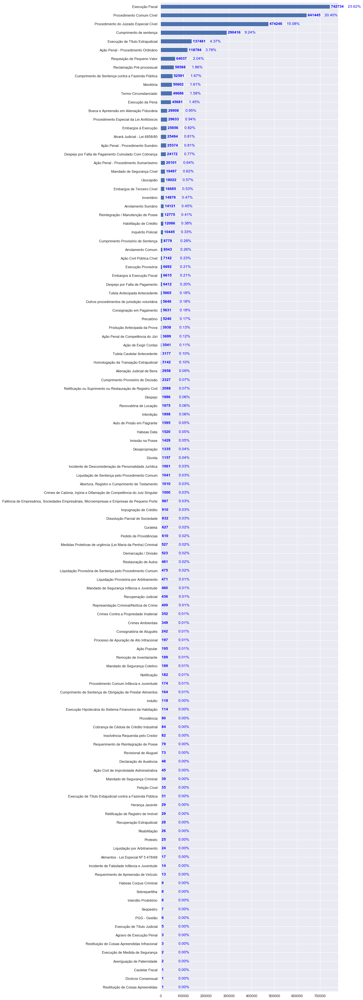

717it [00:00, 2185.15it/s]


Assunto


None

717

436

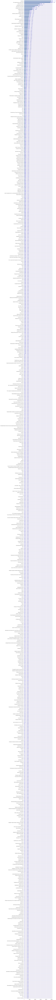

1801it [00:00, 2446.91it/s]


Magistrado


None

1801

3772

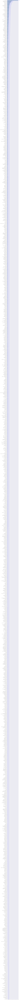

318it [00:00, 2771.79it/s]


Comarca


None

318

138537

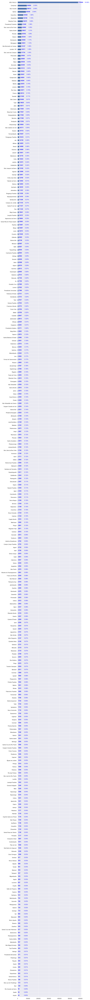

347it [00:00, 2739.61it/s]


Foro


None

347

138537

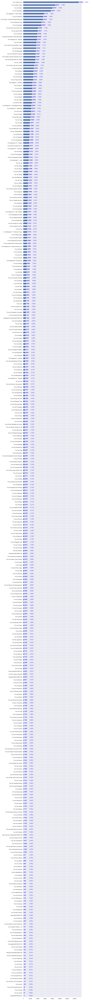

253it [00:00, 2697.79it/s]


Vara


None

253

138537

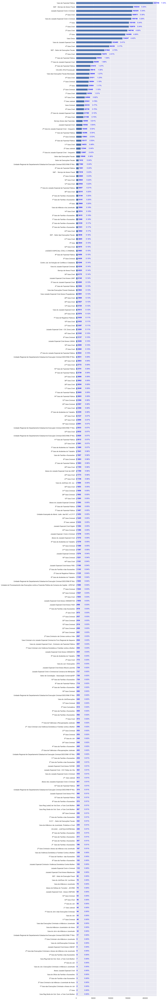

15it [00:00, 2505.86it/s]


Data_disp


None

15

436

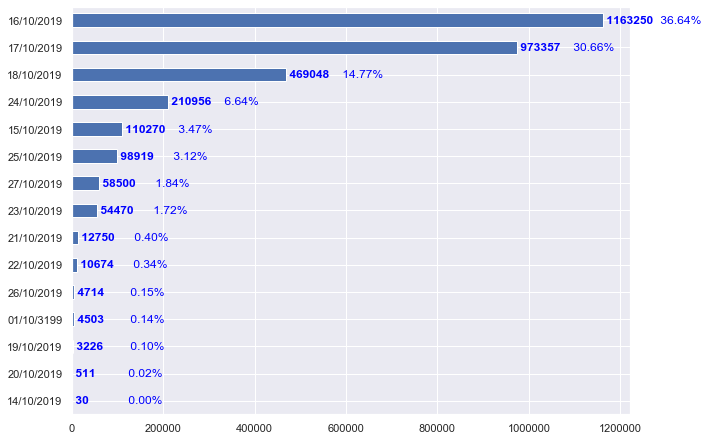

In [2]:
import seaborn as sns
sns.set()
for col in cols:
    variavel = col
    ax = df_empilhado[variavel].value_counts().sort_values().plot(kind = 'barh', figsize=(10,df_empilhado[variavel].nunique()/2))
    offset = df_empilhado[variavel].value_counts().max() * 0.1
    denom = df_empilhado[variavel].value_counts().sum()
    for i, v in tqdm(enumerate(df_empilhado[variavel].value_counts().sort_values())):
        plt.text(v, i, " "+str(v), color='blue', va='center', fontweight='bold')
        plt.text(v + offset, i, " "+str('{0:.2f}'.format((v/denom)*100))+"%", color='blue', va='center')
    display(print(col))
    display(df_empilhado[variavel].nunique())
    display(df_empilhado[variavel].isnull().sum())
    plt.show()]

In [38]:
df_empilhado.head()

,Assunto,Classe,Comarca,Data_disp,Foro,Magistrado,Teor,Teor_preprocessado,Unnamed: 0,Vara,id
0,ICMS/ Imposto sobre Circulação de Mercadorias,Execução Fiscal,NaN,17/10/2019,NaN,Silvio José Pinheiro dos Santos,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,"_NUM_. homologo sentenca, produza legais efeit...",0.0,NaN,0510281-08.2002.8.26.0577
1,Regime Inicial - Fechado,Execução Provisória,SÃO PAULO,17/10/2019,São Paulo/DEECRIM UR1,Ana Helena Rodrigues Mellim,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,". relacao delito artigo _NUM_ codigo penal, de...",1.0,Unidade Regional de Departamento Estadual de E...,0018952-40.2019.8.26.0041
2,Constrição / Penhora / Avaliação / Indisponibi...,Cumprimento de sentença,Patrocínio Paulista,17/10/2019,Foro de Patrocínio Paulista,FERNANDO DA FONSECA GAJARDONI,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,. _NUM_. fls. _NUM_: caracterizada hipotese ar...,2.0,Vara Única,0000443-07.2018.8.26.0426
3,Impostos,Execução Fiscal,Araraquara,17/10/2019,Foro de Araraquara,João Baptista Galhardo Júnior,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,". ante requerimento exequente, noticiando ocor...",3.0,1º Vara da Fazenda Pública,1521460-91.2019.8.26.0037
4,IPTU/ Imposto Predial e Territorial Urbano,Requisição de Pequeno Valor,NaN,17/10/2019,NaN,Luciana Mezzalira Mendonça de Barros,\n\t\t\t\t\t\t\t\t\t\t\t\t\t\n\n\nTRIBUNAL DE ...,. _NUM_ - tendo vista comprovacao deposito con...,4.0,NaN,0000668-76.2019.8.26.0075


In [119]:
df_grafo.Assunto.value_counts().head(20)

Assunto não informado.                       25
Obrigações                                   18
Obrigação de Fazer / Não Fazer               16
Locação de Imóvel                            16
Liquidação / Cumprimento / Execução          14
Prestação de Serviços                        14
Inadimplemento                               13
Inventário e Partilha                        12
Contratos Bancários                          12
Indenização por Dano Moral                   12
Antecipação de Tutela / Tutela Específica    11
Compra e Venda                               11
Espécies de Contratos                        11
Liminar                                      11
Valor da Execução / Cálculo / Atualização    11
Tráfico de Drogas e Condutas Afins           10
Indenização por Dano Material                10
Pagamento                                    10
DIREITO CIVIL                                 9
Bancários                                     9
Name: Assunto, dtype: int64

In [114]:
from graphviz import Digraph, Source
import pylab
import pydotplus
df_grafo = df_empilhado.groupby(['Classe', 'Assunto']).size().to_frame(name = 'Quant').reset_index()
assuntos_comuns_top_30 = df_grafo.Assunto.value_counts().head(30).reset_index()['index'].tolist()

df_g = df_grafo.loc[df_grafo.Assunto.isin(assuntos_comuns_top_30)]

g = Digraph('G', filename='process.gv', engine='sfdp')
g.attr('graph', overlap='scale')

for index, row in df_g.iterrows():
    g.edge(str(row["Classe"]), str(row["Assunto"]), label='')

    
g.save("g.dot")

'g.dot'

In [124]:
import nltk
stemmer = nltk.stem.RSLPStemmer()
stemmer.stem('cheguei')

'cheg'